# Local features

<figure class="image">
  <img src="../figures/local_features-panorama_match.png" alt="" style="width: 6.4in;"/>
  <figcaption>Source: <a href=http://www.cs.ubc.ca/~mbrown/papers/iccv2003.pdf>http://www.cs.ubc.ca/~mbrown/papers/iccv2003.pdf</a></figcaption>
</figure>

<figure class="image">
  <img src="../figures/local_features-panorama_stitch.png" alt="" style="width: 6.4in;"/>
  <figcaption>Source: <a href=http://www.cs.ubc.ca/~mbrown/papers/iccv2003.pdf>http://www.cs.ubc.ca/~mbrown/papers/iccv2003.pdf</a></figcaption>
</figure>

In [1]:
from typing import Literal

import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import scipy
import skimage

In [2]:
plt.rcParams['figure.constrained_layout.use'] = True
np.set_printoptions(threshold=20, edgeitems=10, linewidth=140, precision=3, suppress=True)

In [3]:
def imshow_grid(
    nrows: int | None = None,
    ncols: int | None = None,
    figsize: tuple[float, float] | None = None,
    cmap: str | None = None,
    vmin: int | float | Literal['min'] = 0.0,
    vmax: int | float | Literal['dtype', 'max'] = 'dtype',
    grid: bool = False,
    colorbar: bool = True,
    interpolation: Literal['nearest', 'bilinear'] = 'nearest',
    axis_off: bool = True,
    proportional: bool = False,
    symmetric_colorbar: bool = True,
    **images,
) -> tuple[plt.Figure, np.ndarray]:
    if nrows is None:
        nrows = 1
    if ncols is None:
        ncols = -int(-len(images) // nrows)  # ceil
    if figsize is None:
        # fig_size_y = sum(img.shape[0] / img.shape[1] for img in images.values()) / len(images) * nrows * plt.rcParams['figure.figsize'][1]
        fig_size_y = nrows * plt.rcParams['figure.figsize'][1]
        fig_size_x = max(1, (ncols + 1) / 2) * plt.rcParams['figure.figsize'][0]
    else:
        fig_size_x, fig_size_y = figsize
    if proportional:
        if nrows > 1:
            raise ValueError
        gridspec_kw = {'width_ratios': [img.shape[1] for img in images.values()]}
    else:
        gridspec_kw = None
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_size_x, fig_size_y), layout='constrained', gridspec_kw=gridspec_kw)
    axes = np.atleast_1d(axes)
    im = None
    rgb_only = True
    for ax, (name, img) in zip(axes.flat, images.items()):
        _vmin = vmin
        if _vmin == 'min':
            _vmin = img.min()
        _vmax = vmax
        if _vmax == 'dtype':
            _vmax = np.iinfo(img.dtype).max if np.issubdtype(img.dtype, np.integer) else 1.0
        elif _vmax == 'max':
            _vmax = img.max()
        if symmetric_colorbar and _vmin < 0:
            abs_max = max(abs(_vmin), abs(_vmax))
            _vmin = -abs_max
            _vmax = abs_max
        _cmap = cmap
        if _cmap is None:
            if (_vmin, _vmax) in ((0.0, 1.0), (0, 255)):
                _cmap = 'gray'
            elif _vmin >= 0:
                _cmap = plt.rcParams['image.cmap']
            else:
                _cmap = 'coolwarm'
        im = ax.imshow(img, cmap=_cmap, vmin=_vmin, vmax=_vmax, interpolation=interpolation)
        ax.grid(grid)
        ax.set_title(name)
        if axis_off:
            ax.axis('off')
        if img.ndim < 3 or img.shape[2] != 3:
            rgb_only = False
    if colorbar and im is not None and not rgb_only:
        if ncols > nrows:
            orientation = 'horizontal'
        elif ncols == nrows:
            orientation = 'horizontal' if im.get_size()[1] > im.get_size()[0] else 'vertical'
        else:
            orientation = 'vertical'
        if vmin == 'min' or vmax == 'max':
            for ax in axes.flat[: len(images)]:
                fig.colorbar(ax.images[0], ax=ax, orientation=orientation, aspect=30)
        else:
            fig.colorbar(im, ax=axes, orientation=orientation, aspect=50)
    return fig, axes

# Desirable local features properties

1. Repeatability
   - Different views of the same scene should yield the same set of local interest regions, even in presence of geometric or intensity transformations.
2. Discriminativity
   - We should be able to match corresponding regions from two images based on their appearance.
   - That means the local regions must have a rich texture using which we can differentiate between them.
3. Compactness
   - The local regions should be as small as possible, but retain texture.
   - Otherwise we would match too "globally".

- We'll cover two types of local features: **corners** and **blobs**.

# Corner Detection

## Harris corner detector

- Harris corner detector can be derived in two equivalent ways.
- To determine whether a point is a corner or not, either:
  1. or analyze local gradient distribution around each pixel (arguably more straighforwatd and easier to understand),
  2. analyze local correlation around each pixel.
- Both ways are equivalent and lead to computation and analysis of the same autocorrelation matrix.

**Local gradient distribution approach**
1. Compute local image gradients around the vicinity of each pixel (the size of the neighborhood is a user hyper-parameter).
2. Look at the gradient *distribution*:  
   1. if all of the **gradients are weak**, the pixel likely resides in a **flat region**,
   2. if gradients mostly **point in the same direction**, the pixel probably lies on an **edge**,
   3. if gradients have **large magnitude in multiple directions**, the likely pixel is a **corner**.
- Details of the gradient distribution analysis:
  1. Compute image derivatives $I_x(x, y)$ and $I_y(x, y)$ around the neighborhood of each pixel $(u ,v)$. Each pixel gives us one pair $(I_x, I_y)$, where we omit the $(x, y)$ for clarity.
  2. Fit an ellipse to the "cloud" of collected 2D points $(I_x, I_y)$ by computing eigenvalues and eigenvectors of the **autocorrelation matrix**
     $$
     \bold{M}
     = \begin{bmatrix}
         \displaystyle\sum_{x, y}I_x^2         & \displaystyle\sum_{x, y}I_x \cdot I_y \\
         \displaystyle\sum_{x, y}I_y \cdot I_x & \displaystyle\sum_{x, y}I_y^2
     \end{bmatrix}
     $$
     where the $\sum_{x, y}$ means we're aggregating the gradients over some neighborhood of $(u, v)$.
     - Eigenvalues correspond to *sizes* of the major and minor axes,
     - eigenvectors correspond to *directions* of the major and minor axes.
  3. The size and ratio of the two axes tell us what kind of region we're in, see the figure below.

<figure class="image">
  <img src="../figures/local_features-flat_edge_corner_derivatives.png" alt="" style="width: 9.6in;"/>
  <figcaption>Various types of regions and their derivatives</a></figcaption>
</figure>

**Local correlation approach**
1. Crop a region around each point (the size of the neighborhood is a user hyper-parameter). 
2. Move the region around and measure its L2 dissimilarity to the original position, i.e.  
   $$
   E(\Delta x, \Delta y) = \sum_{x, y}{ \left( I(x + \Delta x, y + \Delta y) - I(x, y) \right)^2 }
   $$
3. Look at the behavior of the dissimilarity:
   1. if it **does not change** with position, the center pixel likely resides in a *flat region**,
   2. if it changes only **in one direction**, the pixel probably lies on an **edge**,
   3. if it changes in **all directions**, the pixel likely is a corner.

<figure class="image">
  <img src="../figures/local_features-corners_generally.png" alt="" style="width: 9.6in;"/>
  <figcaption>Moving the window around to determine direction of change of appearance.</a></figcaption>
</figure>

<figure class="image">
  <img src="../figures/local_features-harris_autocorrelation.png" alt="" style="width: 6.4in;"/>
  <figcaption>L2 distance between the shifted and original window.</a></figcaption>
</figure>

- Details:
  1. To make the dissimilarity computation efficient, each pixel's neighborhood is approximated by first order Taylor expansion  
     $$
     I(x + \Delta x, y + \Delta y) \approx I(x, y) + I_x(x, y) \cdot \Delta x + I_y(x, y) \cdot \Delta y
     $$
  2. This leads to (omitting the $(x, y)$ coordinates for clarity)  
     $$
     \begin{align*}
     E(\Delta x, \Delta y) &\approx \sum_{x, y}{ \left( I - I_x \cdot \Delta x + I_y \cdot \Delta y - I \right)^2 } \\
      &=  \sum_{x, y}{ \left( I_x^2 \cdot \Delta x^2 + 2 \cdot I_x \cdot I_y \cdot \Delta x \cdot \Delta y + I_y^2 \cdot \Delta y^2 \right) } \\
      &= \begin{bmatrix}
        \Delta x & \Delta y
      \end{bmatrix}
      \cdot
      \bold{M}
      \cdot
      \begin{bmatrix}
        \Delta x \\
        \Delta y
      \end{bmatrix}
     \end{align*}
     $$
     where $\bold{M}$ is the same **autocorrelation matrix** as above.
  3. Compute the eigenvalues and eigenvectors of the autocorrelation matrix $\bold{M}$.  
     Eigenvectors tell us dominant directions of the local autocorrelation surface.  
     The size and ratio of eigenvalues tell us what kind of region we're in, see the figure above.

**Forming the autocorrelation matrix**
- One omitted detail is that the matrix $\bold{M}$ is actually formed as a **weighted** sum of the neighboring gradients.
- The weights are determined by an isotropic 2D Gaussian function $G$ centered around each pixel with some $\sigma$ (a hyperparameter).
- This means that gradients $(I_x, I_y)$ that are closer to the current pixel $(u, v)$ have a higher weight in the sums inside the matrix $\bold{M}$.

**Corneress measure**
- Harris proposed to measure a "corneress" (i.e. how much it looks like a corner) of each pixel as  
  $$
  R = \underbrace{\lambda_1 \cdot \lambda_2}_{\det(\bold{M})} - \alpha \cdot (\underbrace{\lambda_1 + \lambda_2}_{\text{trace}(\bold{M})})^2
  $$
  where
  - $\lambda_1$ and $\lambda_2$ are eigenvalues of $\bold{M}$,
  - $\alpha$ is a hyperparameter, usually $\alpha \approx 0.04$.
- Since we only care about the value of $R$ and not the eigenvalues themselves, we don't actually need to solve the eigenvalue problem, because  
  $$
  \det(\bold{M}) = m_{1,1} \cdot m_{2,2} - m_{1,2} \cdot m_{2,1} \qquad \text{and} \qquad \text{trace}(\bold{M}) = m_{1,1} + m_{2,2}
  $$

<figure class="image">
  <img src="../figures/local_features-harris_eigenvalues.svg" alt="" style="width: 4.3in;"/>
  <figcaption>Corneress measure depending on eigenvalues.</a></figcaption>
</figure>

**Harris corner detector algorithm**

1. For each point of an input image $I$ of size $M \times N$
   1. Compute image derivatives $I_x$ and $I_y$ in $x$ and $y$ directions, respectively, a.k.a. the gradient
      $$
      \nabla I = \begin{bmatrix}
          I_x \\
          I_y
      \end{bmatrix}
      $$
   2. Compute a matrix (structure tensor)
      $$
      \bold{D}
      = \nabla I \cdot (\nabla I)^\top
      = \begin{bmatrix}
          I_x^2         & I_x \cdot I_y \\
          I_y \cdot I_x & I_y^2
      \end{bmatrix}
      $$
   3. Compute an "autocorrelation" matrix $\bold{M}$ by convolving (smoothing) $\bold{D}$ with a discrete Gaussian window $G$
      $$
      \bold{M} = G * \bold{D} = G * \begin{bmatrix}
          I_x^2         & I_x \cdot I_y \\
          I_y \cdot I_x & I_y^2
      \end{bmatrix}
      = \begin{bmatrix}
          G * I_x^2         & G * (I_x \cdot I_y) \\
          G * (I_y \cdot I_x) & G * I_y^2
      \end{bmatrix}
      $$
   4. For each pixel, compute a "corneress" measure
      $$
      R = \det(\bold{M}) - \alpha \cdot \text{trace}(\bold{M})^2
      $$
      
2. Find local maxima in $R$. Each local maximum at position $(x,y)$ with corresponding value of $R(x,y) \gt t$ will be considered a corner.

In [4]:
def find_local_maxima(arr: np.ndarray, threshold: float = 0, neighborhood_size: int = 3) -> np.ndarray:
    filtered = scipy.ndimage.maximum_filter(arr, size=neighborhood_size)
    local_max = (arr == filtered) & (arr >= threshold)
    return np.argwhere(local_max)

In [5]:
def corner_harris(
    gray: np.ndarray,
    sigma: float = 3.0,
    alpha: float = 0.04,
    threshold_rel: float = 0.01,
) -> tuple[np.ndarray, np.ndarray]:
    # Step 1 (gradient)
    dx = skimage.filters.sobel_v(gray)
    dy = skimage.filters.sobel_h(gray)

    # Step 2
    dx2 = dx * dx
    dxdy = dx * dy
    dy2 = dy * dy

    # Step 3 (smoothing)
    dx2 = scipy.ndimage.gaussian_filter(dx2, sigma)
    dxdy = scipy.ndimage.gaussian_filter(dxdy, sigma)
    dy2 = scipy.ndimage.gaussian_filter(dy2, sigma)

    # Step 4 (harris corner measure)
    corneress = dx2 * dy2 - dxdy**2 - alpha * (dx2 + dy2) ** 2

    # Step 5 (thresholding + non-max suppression)
    corners = find_local_maxima(corneress)  # non-maximum suppression
    strong = corneress[corners[:, 0], corners[:, 1]] > threshold_rel * corneress.max()  # thresholding

    return corners[strong], corneress

In [6]:
simple_rgb = skimage.io.imread('../data/simple.jpg')
simple_gray = skimage.color.rgb2gray(simple_rgb)

In [7]:
corners, corneress = corner_harris(simple_gray, threshold_rel=0.01)
corners.shape

(53, 2)

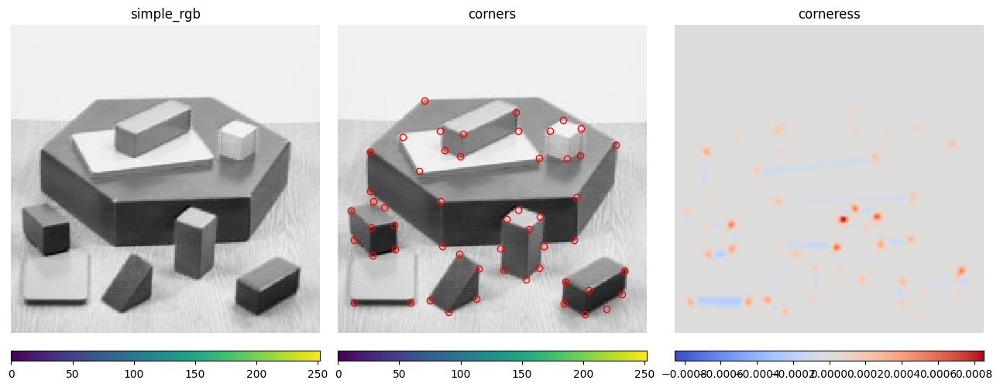

In [8]:
fig, axes = imshow_grid(simple_rgb=simple_rgb, corners=simple_rgb, corneress=corneress, vmin='min', vmax='max')
axes[1].plot(corners[:, 1], corners[:, 0], 'ro', mfc='none');

## Other variants

<figure class="image">
  <img src="../figures/local_features-harris_st_mops.png" alt="Interpolation" style="width: 9.6in;"/>
  <figcaption>
    <br>
    Source: [Burger22], Fig. 6.5
  </figcaption>
</figure>

- There are also Good Features To Track (GFTT) that use by default Shi-Tomasi corner detection method, but also add several other considerations to the method of detection, such as minimum distance between corners, relative thresholds of corneress quality etc.

# Blob detection

## Laplacian of Gaussian (LoG)

- Recall from lecture [edge_primitives](edge_primitives.ipynb) that the Laplacian operator is defined as  
  $$
  \nabla^2 = \frac{\partial^2}{\partial x^2} + \frac{\partial^2}{\partial y^2}
  $$
- The Laplacian behaves as a "point" detector, i.e. it will produce a large (in abosolute value) response for peaks or troughs in a flat neighborhood.
- In other words, it responds most strongly to local brightness "outliers", i.e. single-pixel large "blobs".
- In order to make it respond to blobs of different size, we may try to detect the peaks/troughs in an image $I$ filtered by a Gaussian $G_\sigma$ with some $\sigma$, i.e. in  
  $$
  L(x, y, \sigma) = I(x, y) * G(x, y, \sigma)
  $$
- We may utilize linearity of convolution and apply the Laplacian operator to G and *then* convolve. This defines the **LoG operator**, i.e.  
  $$
  \nabla^2 L(x, y, \sigma) = I * \nabla^2 G(x, y, \sigma)
  $$
- In order to compensate for higher $\sigma$ values causing smaller max. magnitudes of the $\nabla^2 L(x, y, \sigma)$, we use the **normalized LoG**  
  $$
  \sigma^2 \cdot \nabla^2 L(x, y, \sigma) = \sigma^2 \cdot I * \nabla^2 G(x, y, \sigma)
  $$
- Each local maximum $(x^*,y^*,\sigma^*)$ in $\sigma^2 \cdot \nabla^2 L(x,y,\sigma)$ corresponds to a blob
  - at position $(x^*,y^*)$
  - and size proportional to $\sigma^*$

<figure class="image">
  <img src="../figures/local_features-log.png" alt="Interpolation" style="width: 12.8in;"/>
  <figcaption>
    LoG blob detection in 1D.
    <br>
  </figcaption>
</figure>

In [9]:
def detect_blobs_log(
    gray: np.ndarray,
    sigmas: np.ndarray | tuple[float, float, int] = (2.0, 32.0, 16),
    threshold: float = 0.0,
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    gray = skimage.util.img_as_float(gray)
    if isinstance(sigmas, tuple):
        sigmas = np.geomspace(sigmas[0], sigmas[1], sigmas[2])

    lap_kernel = np.array(
        [
            [0, 1, 0],
            [1, -4, 1],
            [0, 1, 0],
        ]
    )

    # Scale-space and Laplacian of Gaussian
    gaussians = np.zeros((len(sigmas),) + gray.shape)
    nlogs = np.zeros((len(sigmas),) + gray.shape)
    for i, sigma in enumerate(sigmas):
        gaussians[i] = scipy.ndimage.gaussian_filter(gray, sigma)
        nlogs[i] = sigma**2 * scipy.ndimage.convolve(gaussians[i], lap_kernel)

    # Use absolute value of NLoG to detect both dark and bright blobs
    blobs = find_local_maxima(np.abs(nlogs), threshold=threshold, neighborhood_size=3)
    
    return blobs, gaussians, nlogs, sigmas

In [10]:
sunflowers_rgb = cv.imread('../data/sunflowers.png')[..., ::-1]
sunflowers_gray = cv.cvtColor(sunflowers_rgb, cv.COLOR_RGB2GRAY)
sunflowers_gray.shape, sunflowers_gray.dtype, sunflowers_gray.min(), sunflowers_gray.max()

((323, 768), dtype('uint8'), np.uint8(5), np.uint8(254))

In [11]:
sunflowers_blobs_log, sunflower_gaussians, sunflowers_nlogs, sunflowers_sigmas = detect_blobs_log(sunflowers_gray, sigmas=(4.0, 16.0, 16), threshold=0.15)
sunflowers_blobs_log

array([[  0,  74, 468],
       [  0,  76, 527],
       [  0,  78, 612],
       [  0,  79,  76],
       [  0,  79, 738],
       [  0,  80,  45],
       [  0,  84, 730],
       [  0,  85, 240],
       [  0,  85, 288],
       [  0,  88, 127],
       ...,
       [ 11, 254, 724],
       [ 11, 299, 241],
       [ 12, 287, 357],
       [ 12, 322, 239],
       [ 12, 322, 444],
       [ 12, 322, 480],
       [ 13, 322,  94],
       [ 14,  74, 406],
       [ 14, 322, 346],
       [ 15, 322, 274]], shape=(488, 3))

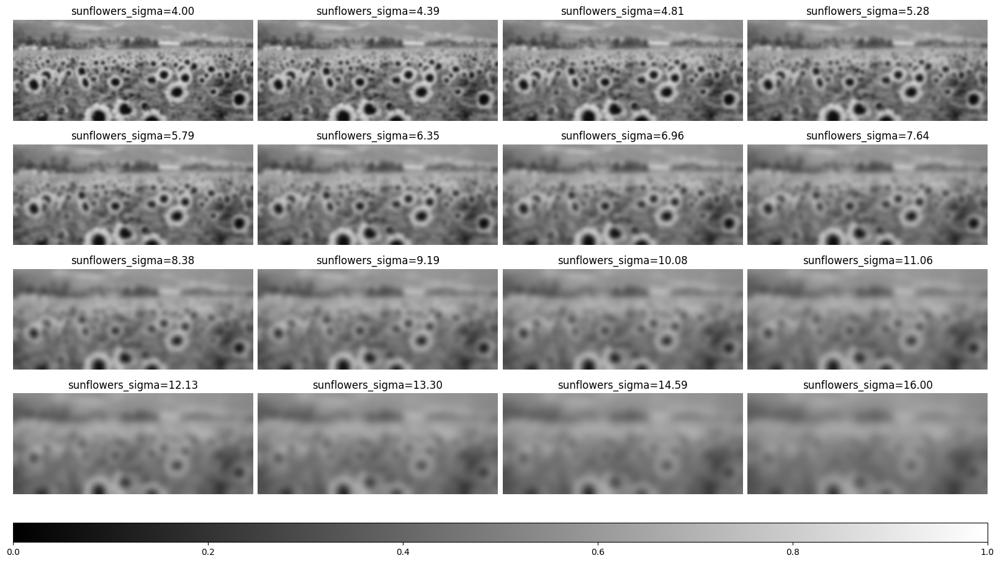

In [12]:
imshow_grid(4, 4, figsize=(16, 9), **{f'sunflowers_sigma={sigma:.2f}': sunflower_gaussians[i] for i, sigma in enumerate(sunflowers_sigmas)});

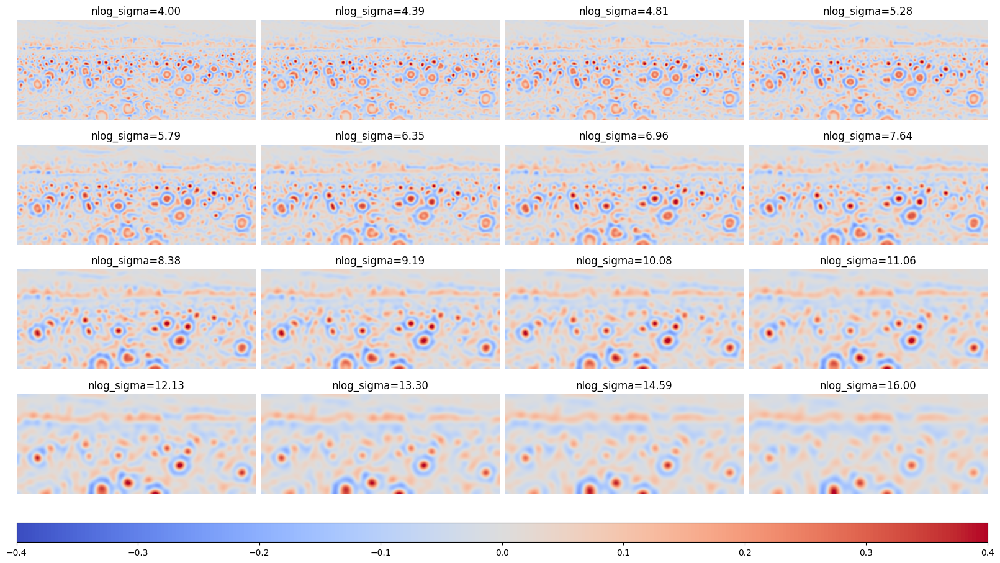

In [13]:
imshow_grid(4, 4, figsize=(16, 9), **{f'nlog_sigma={sigma:.2f}': sunflowers_nlogs[i] for i, sigma in enumerate(sunflowers_sigmas)}, vmin=-0.4, vmax=0.4);

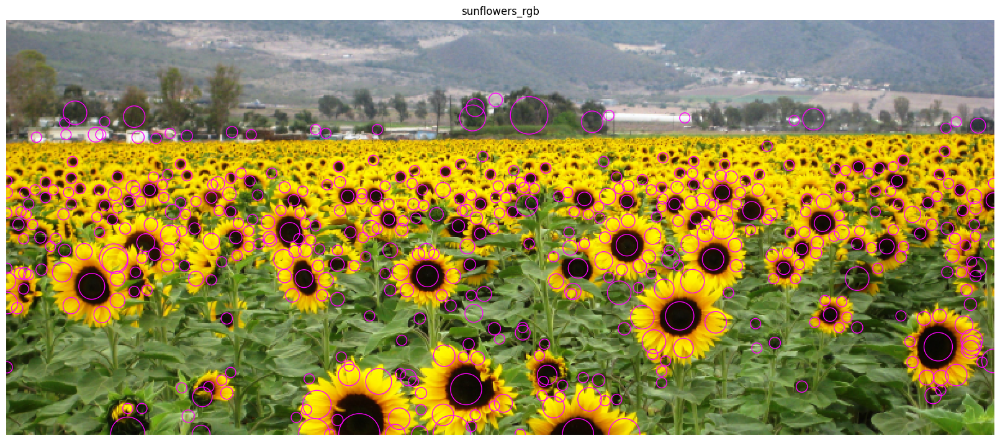

In [14]:
fig, axes = imshow_grid(sunflowers_rgb=sunflowers_rgb, figsize=(16, 8))
for s, y, x in sunflowers_blobs_log:
    c = plt.Circle((x, y), sunflowers_sigmas[s], color=(1, 0, 1), linewidth=1, fill=False)
    axes[0].add_patch(c)

## Difference of Gaussians (DoG)

- Difference of two images Gaussian-blurred using different $\sigma$ behaves as an approximation to normalized LoG, i.e.  
  $$
  \frac{\sigma}{\Delta \sigma} \cdot \left(  L(x, y, \sigma + \Delta \sigma) - L(x, y, \sigma) \right) \approx \sigma^2 \cdot I * \nabla^2 G(x, y, \sigma)
  $$

<figure class="image">
  <img src="../figures/local_features-dog.png" alt="Interpolation" style="width: 6.4in;"/>
  <figcaption>
    <br>
    Source: <a href="https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf">Distinctive Image Features from Scale-Invariant Keypoints</a>, Fig. 1
  </figcaption>
</figure>

In [15]:
def detect_blobs_dog(
    gray: np.ndarray,
    sigmas: np.ndarray | tuple[float, float, int] = (2.0, 32.0, 16),
    threshold: float = 0.0,
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    gray = skimage.util.img_as_float(gray)
    if isinstance(sigmas, tuple):
        sigmas = np.geomspace(sigmas[0], sigmas[1], sigmas[2])
        sigmas = np.insert(sigmas, 0, sigmas[0] ** 2 / sigmas[1])  # add one sigma smaller for DoG

    # Scale-space
    gaussians = np.zeros((len(sigmas),) + gray.shape)
    for i, sigma in enumerate(sigmas):
        gaussians[i] = scipy.ndimage.gaussian_filter(gray, sigma)

    # Normalized Difference of Gaussian
    ndogs = gaussians[1:] - gaussians[:-1]
    ndogs *= sigmas[1:, None, None] / (sigmas[1:] - sigmas[:-1])[:, None, None]
    
    # Use absolute value of NLoG to detect both dark and bright blobs
    blobs = find_local_maxima(np.abs(ndogs), threshold=threshold, neighborhood_size=3)
    
    return blobs, gaussians[1:], ndogs, sigmas[1:]

In [16]:
sunflowers_blobs_dog, _, sunflowers_ndogs, _ = detect_blobs_dog(sunflowers_gray, sigmas=(4.0, 16.0, 16), threshold=0.15)
sunflowers_blobs_dog

array([[  0,  67, 306],
       [  0,  70, 376],
       [  0,  74, 468],
       [  0,  75, 510],
       [  0,  76, 213],
       [  0,  76, 527],
       [  0,  78, 612],
       [  0,  79,  29],
       [  0,  79,  76],
       [  0,  79, 738],
       ...,
       [ 11, 299, 241],
       [ 12, 287, 357],
       [ 12, 322, 239],
       [ 12, 322, 444],
       [ 12, 322, 480],
       [ 14, 322,  94],
       [ 14, 322, 346],
       [ 15,  74, 407],
       [ 15, 300, 310],
       [ 15, 317, 274]], shape=(586, 3))

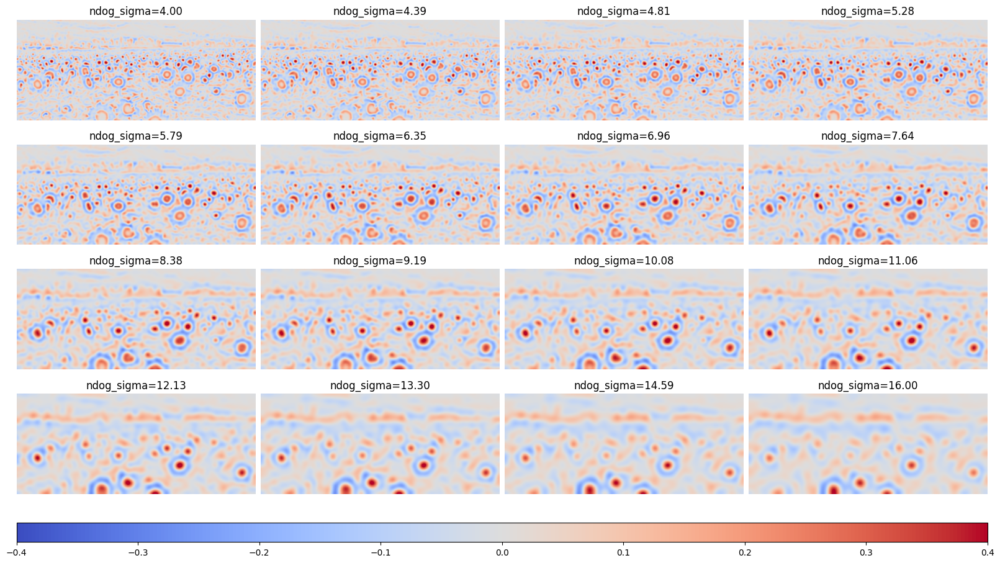

In [17]:
imshow_grid(4, 4, figsize=(16, 9), **{f'ndog_sigma={sigma:.2f}': sunflowers_ndogs[i] for i, sigma in enumerate(sunflowers_sigmas)}, vmin=-0.4, vmax=0.4);

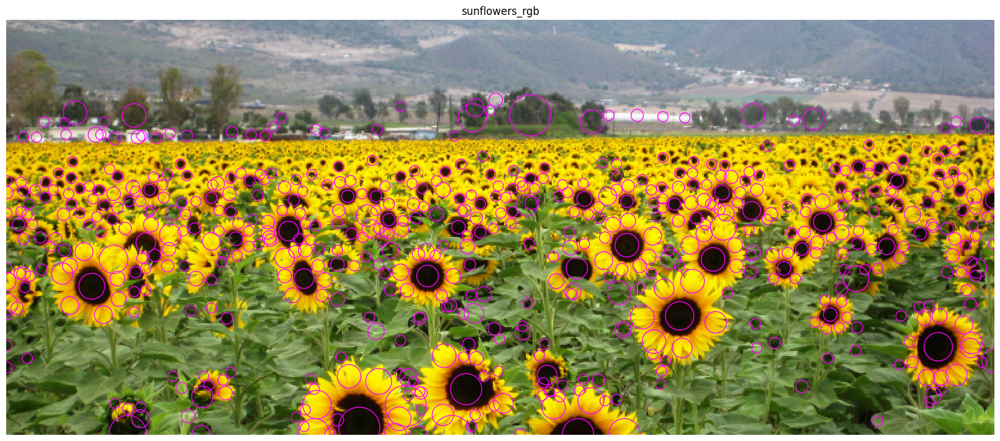

In [18]:
fig, axes = imshow_grid(sunflowers_rgb=sunflowers_rgb, figsize=(16, 8))
for s, y, x in sunflowers_blobs_dog:
    c = plt.Circle((x, y), sunflowers_sigmas[s], color=(1, 0, 1), linewidth=1, fill=False)
    axes[0].add_patch(c)

# Scale-Invariant Feature Transform (SIFT)

1. Detect keypoints as blobs using DoG - this gives us position $(x, y)$ and scale ($\sigma$).
2. Determine the dominant orientation $\phi$ of each keypoint.
3. Extract descriptor of each keypoint taking into account its orientation scale $\sigma$ and $\phi$.

## Determining dominant orientation of keypoints

<figure class="image">
  <img src="../figures/local_features-sift_orientation.png" alt="Interpolation" style="width: 9.6in;"/>
  <figcaption>
    
  </figcaption>
</figure>

### Algorithmic details and refinements

**Scale space**
- Usually, the base number of octaves is $k = 4$.
- There are also additional layers to aid local maxima detection.
- Each octave halves the spatial resolution for efficiency.

**Elimination of points along edges**
- Naïve implementataion like above would produce too many keypoints near edges.
- Such keypoints are filtered by analyzing 2nd order derivatives, namely the Hessian.
- All keypoitns must satisfy  
  $$
  \frac{ \text{trace}(\bold{H})^2 }{ \det{\bold{H}} } \lt \frac{ (r+1)^2 }{ r }
  $$
  where
  - $\bold{H}$ is the Hessian matrix,
  - $r = 10$ is an empirically found threshold of ratio of eigenvalues of $\bold{H}$.

**Sub-pixel keypoint localization**
- SIFT approximates each keypoint's neighborhood by 2nd order Taylor expansion  
  $$
  D(\bold{x}_0 + \bold{x}) = D(\bold{x}_0) + \frac{\partial D^\top}{\partial \bold{x}} \cdot \bold{x} + \frac{1}{2}\, \bold{x}^\top \cdot \frac{\partial^{2} D}{\partial \bold{x}^{2}} \cdot \bold{x}
  $$
  where
  - $\bold{x}_0 = (x, y, \sigma)$ is the keypoint's position,
  - $D$ is the difference of Gaussian response.
- We then refine the keypoint's position by finding the minimum of the Taylor expansion paraboloid, i.e.  
  $$
  \bold{x}^* = -\frac{ \partial^2 D^{-1} }{ \partial \bold{x}^2 } \cdot \frac{ \partial D }{ \partial \bold{x} }
  $$
- The new refined position has *sub-pixel accuracy*.

**More precise orientation determination**
- The orientation histogram actually has 36 bins, not 8.
- Each contribution is weighted by a Gaussian with $\sigma = 1.5 \cdot \sigma_{\text{keypoint}}$.
- Also, there might be *two* significant peaks in the orientation histogram.
- When there is a second peak with at least 80 % of the largest peak, a copy of the keypoint is created at the same position with this second "dominant" orientation.

## Extracting descriptors

<figure class="image">
  <img src="../figures/local_features-sift_descriptor.png" alt="Interpolation" style="width: 9.6in;"/>
  <figcaption>
    
  </figcaption>
</figure>

### Details and refinements

- There actually are 4x4 macrocells, not just 2x2.
- This means the descriptor is 4x4x8 = **128** long, not 32.
- To make the descriptor robust against changes is lighting, it is normalized to unit norm, i.e.  
  $$
  \bold{d}_\text{norm} = \frac{ \bold{d} }{ \lVert\bold{d}\rVert }
  $$
- Also, too high values in $\bold{d}$ are clipped to 0.2, i.e.  
  $$
  \bold{d}_\text{clip} = \min(\bold{d}_\text{norm}, 0.2)
  $$
- After clipping, we need to normalize to unit norm again to produce the final descriptor  
  $$
  \bold{d}_\text{SIFT} = \frac{ \bold{d}_{\text{clip}} }{ \lVert\bold{d_\text{clip}}\rVert }, \qquad \bold{d}_\text{SIFT} \in \mathbb{R}^{128}
  $$

## Example of SIFT keypoint detection and descriptor extraction

In [19]:
box_gray = skimage.io.imread('../data/box.png', as_gray=True)
scene_gray = skimage.io.imread('../data/box_in_scene.png', as_gray=True)
box_gray.shape, box_gray.dtype, scene_gray.shape, scene_gray.dtype

((223, 324), dtype('uint8'), (384, 512), dtype('uint8'))

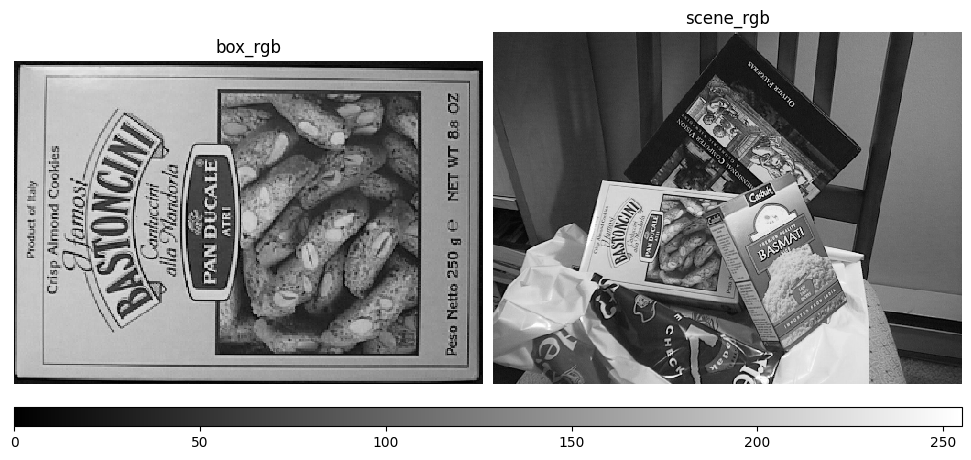

In [20]:
imshow_grid(box_rgb=box_gray, scene_rgb=scene_gray);

In [21]:
box_sift = skimage.feature.SIFT(upsampling=2)
box_sift.detect_and_extract(box_gray)

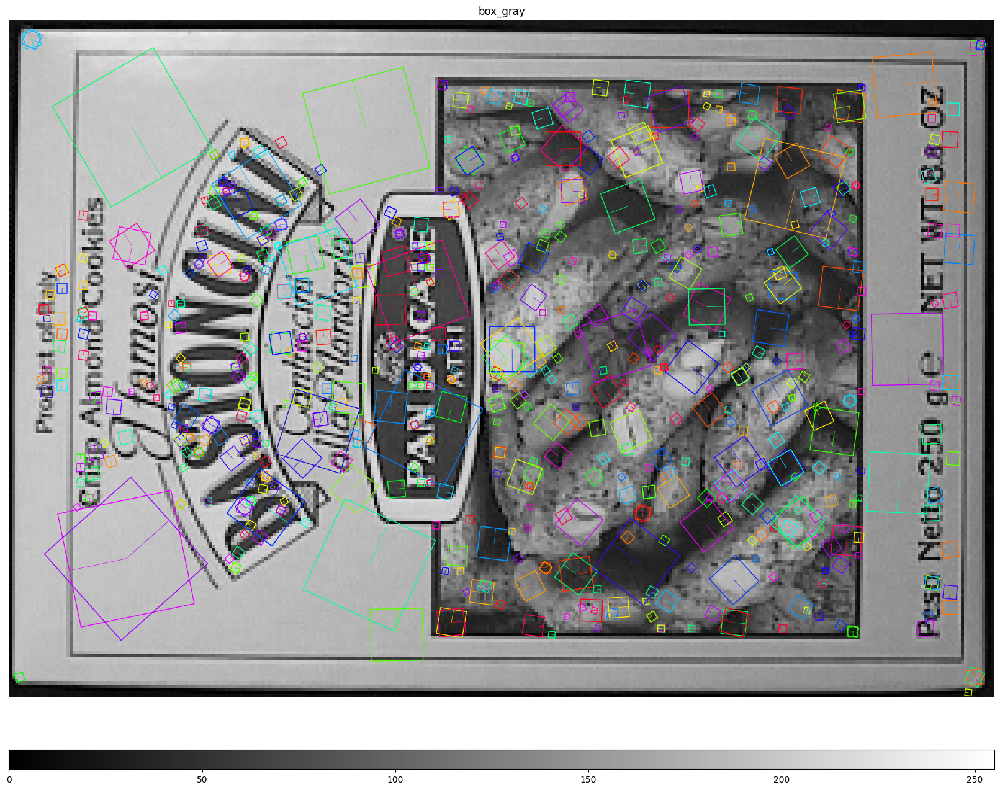

In [22]:
fig, ax = imshow_grid(box_gray=box_gray, figsize=(16, 16));
for y, x, s, a in zip(box_sift.keypoints[:, 0], box_sift.keypoints[:, 1], box_sift.sigmas, box_sift.orientations):
    color = plt.cm.hsv(np.random.rand())
    ax[0].add_patch(plt.Rectangle((x - s, y - s), 2*s, 2*s, angle=np.degrees(a), rotation_point='center', color=color, fill=False, linewidth=1.0))
    ax[0].plot([x, x + s * np.cos(a)], [y, y + s * np.sin(a)], color=color, linewidth=0.5)

In [23]:
scene_sift = skimage.feature.SIFT(upsampling=2)
scene_sift.detect_and_extract(scene_gray)

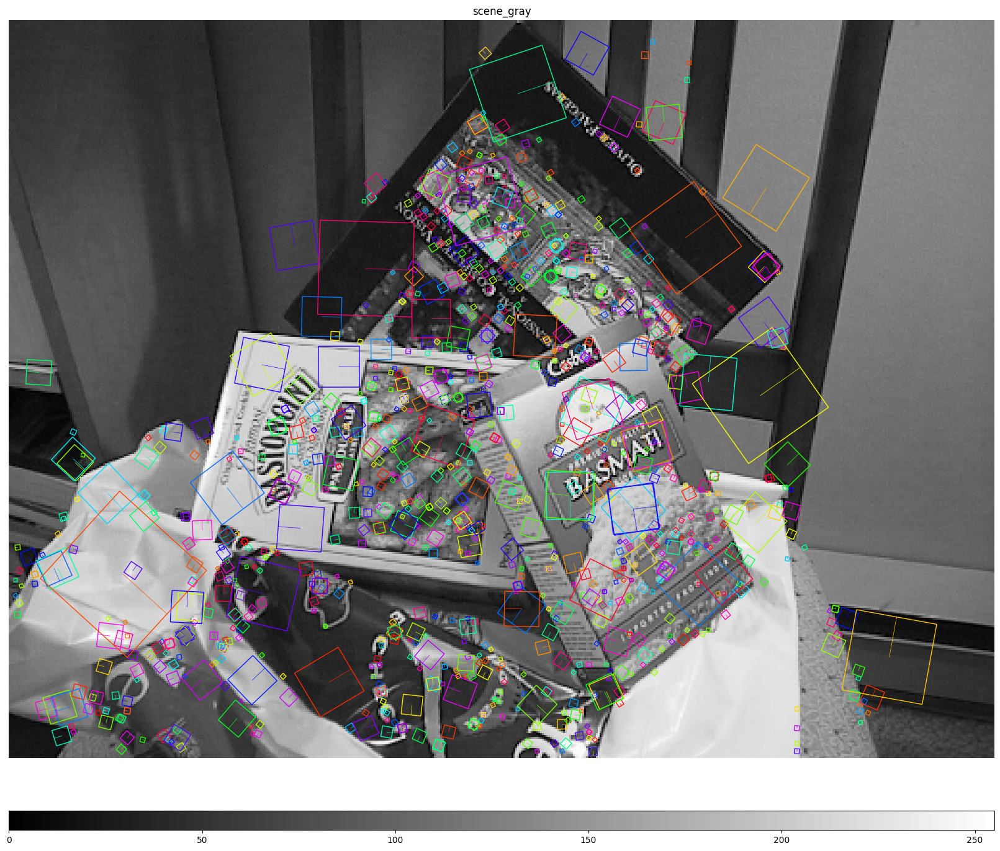

In [24]:
fig, ax = imshow_grid(scene_gray=scene_gray, figsize=(16, 16));
for y, x, s, a in zip(scene_sift.keypoints[:, 0], scene_sift.keypoints[:, 1], scene_sift.sigmas, scene_sift.orientations):
    color = plt.cm.hsv(np.random.rand())
    ax[0].add_patch(plt.Rectangle((x - s, y - s), 2*s, 2*s, angle=np.degrees(a), rotation_point='center', color=color, fill=False, linewidth=1.0))
    ax[0].plot([x, x + s * np.cos(a)], [y, y + s * np.sin(a)], color=color, linewidth=0.5)

## Keypoint matching

In [25]:
matches = []
for i, desc1 in enumerate(box_sift.descriptors):
    dists = np.sum((desc1.reshape(1, -1).astype(float) - scene_sift.descriptors.astype(float)) ** 2, axis=1) ** 0.5
    if len(dists) < 2:
        continue
    inn1, inn2 = np.argsort(dists)[:2]
    ratio = dists[inn1] / dists[inn2]
    if ratio < 0.75:
        matches.append((i, inn1.item()))
len(matches)

106

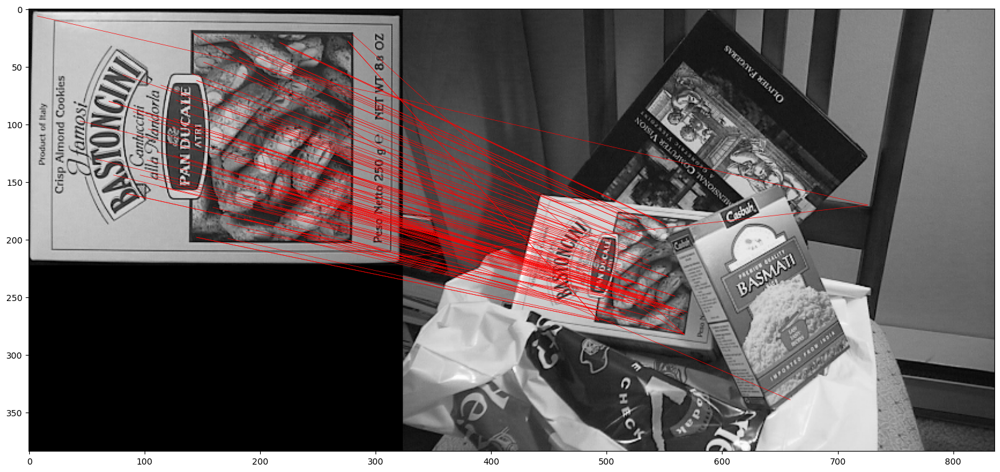

In [26]:
match_gray = np.zeros((max(box_gray.shape[0], scene_gray.shape[0]), box_gray.shape[1] + scene_gray.shape[1]), dtype=box_gray.dtype)
match_gray[: box_gray.shape[0], : box_gray.shape[1]] = box_gray
match_gray[: scene_gray.shape[0], box_gray.shape[1]:] = scene_gray

plt.figure(figsize=(16, 16))
plt.imshow(match_gray, cmap='gray', vmin=0, vmax=255);
for i1, i2 in matches:
    y1, x1 = box_sift.keypoints[i1]
    y2, x2 = scene_sift.keypoints[i2]
    plt.plot([x1, x2 + box_gray.shape[1]], [y1, y2], 'r-', linewidth=0.5)

## Object detection as homography estimation

In [27]:
src_pts = box_sift.keypoints[[i for i, _ in matches], ::-1]  # (y, x) -> (x, y)
dst_pts = scene_sift.keypoints[[j for _, j in matches], ::-1]

model, inliers = skimage.measure.ransac(
    (src_pts, dst_pts),
    skimage.transform.ProjectiveTransform,
    min_samples=4,
    residual_threshold=2,
    max_trials=100
)
model.params, inliers

(array([[  0.442,  -0.166, 118.907],
        [  0.001,   0.4  , 161.066],
        [ -0.   ,  -0.   ,   1.   ]]),
 array([False, False,  True,  True,  True,  True,  True,  True, False,  True, ...,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True], shape=(106,)))

In [28]:
inliers.mean()

np.float64(0.9056603773584906)

In [29]:
box_corners_src = np.array([  # (x, y)
    [0, 0],
    [box_gray.shape[1] - 1, 0],
    [box_gray.shape[1] - 1, box_gray.shape[0] - 1],
    [0, box_gray.shape[0] - 1],
])
box_corners_dst = skimage.transform.matrix_transform(box_corners_src, model.params)
box_corners_dst

array([[118.907, 161.066],
       [283.86 , 175.249],
       [267.737, 298.192],
       [ 89.46 , 272.218]])

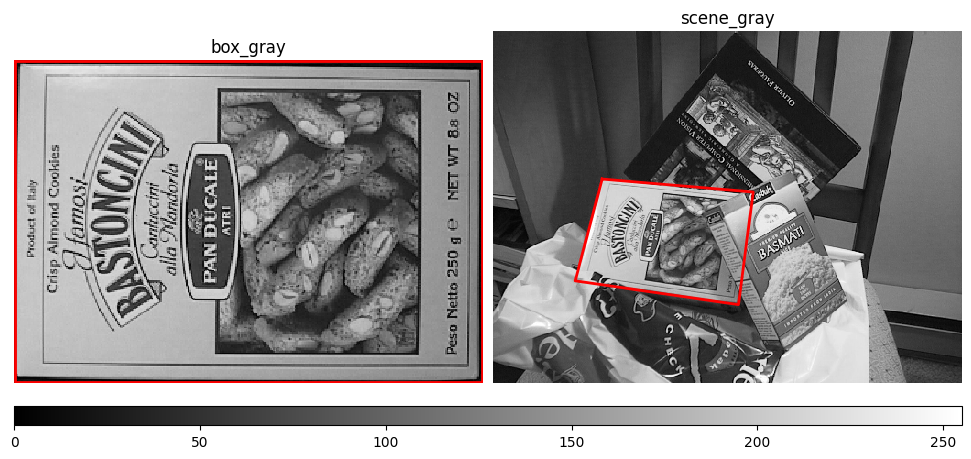

In [30]:
fig, ax = imshow_grid(box_gray=box_gray, scene_gray=scene_gray);
ax[0].plot(box_corners_src[[0, 1, 2, 3, 0], 0], box_corners_src[[0, 1, 2, 3, 0], 1], 'r-', linewidth=2);
ax[1].plot(box_corners_dst[[0, 1, 2, 3, 0], 0], box_corners_dst[[0, 1, 2, 3, 0], 1], 'r-', linewidth=2);

# Other popular detectors and descriptors

**Detectors**

| Detector                                                                                             | Category         | Pros                                    | Cons                         |
|------------------------------------------------------------------------------------------------------|------------------|-----------------------------------------|------------------------------|
| [Harris](https://en.wikipedia.org/wiki/Harris_Corner_Detector)                                       | Classical corner | Simple, stable corners                  | Not scale-invariant          |
| [Shi–Tomasi (GFTT)](https://en.wikipedia.org/wiki/Corner_detection#Shi%E2%80%93Tomasi_detector)      | Classical corner | High-quality corners                    | No scale invariance          |
| [FAST](https://www.edwardrosten.com/work/fast.html)                                                  | Classical corner | Extremely fast                          | No scale or orientation      |
| [SIFT](https://en.wikipedia.org/wiki/Scale-invariant_feature_transform)                              | Classical blob   | Very robust, scale & rotation invariant | Slow, computationally heavy  |
| [SURF](https://en.wikipedia.org/wiki/Speeded_up_robust_features)                                     | Classical blob   | Faster than SIFT                        | Less robust, patented        |
| [ORB](https://en.wikipedia.org/wiki/Oriented_FAST_and_rotated_BRIEF)                                 | Classical corner | Fast, free, rotation invariant          | Limited scale robustness     |
| [BRISK](https://www.research-collection.ethz.ch/bitstream/handle/20.500.11850/43288/eth-7684-01.pdf) | Classical corner | Scale & rotation invariant              | Less distinctive keypoints   |
| [KAZE](https://www.doc.ic.ac.uk/~ajd/Publications/alcantarilla_etal_eccv2012.pdf)                                                         | Classical blob   | High-quality scale space                | Computationally expensive    |
| [AKAZE](https://www.bmva-archive.org.uk/bmvc/2013/Papers/paper0013/index.html)                                                        | Classical blob   | Good accuracy–speed tradeoff            | Slower than ORB              |
| [MSER](https://en.wikipedia.org/wiki/Maximally_stable_extremal_regions)                              | Region-based     | Excellent for text/regions              | Sensitive to blur & lighting |
| [SuperPoint](https://arxiv.org/abs/1712.07629)                                                       | Deep learning    | Highly repeatable keypoints             | Requires training/GPU        |
| [D2-Net](https://arxiv.org/abs/1905.03561)                                                           | Deep learning    | Joint detection & description           | Heavy and slow               |
| [R2D2](https://arxiv.org/abs/1906.06195)                                                             | Deep learning    | Very reliable keypoints                 | Complex training pipeline    |
| [DISK](https://arxiv.org/abs/2006.13566)                                                             | Deep learning    | Optimized for matching                  | Needs task-specific training |
| [KeyNet](https://arxiv.org/abs/1904.00837)                                                           | Deep learning    | Lightweight, accurate                   | Less widely adopted          |


**Descriptors**

| Descriptor                                                                                                                        | Category          | Pros                                    | Cons                                 |
|-----------------------------------------------------------------------------------------------------------------------------------|-------------------|-----------------------------------------|--------------------------------------|
| [SIFT](https://en.wikipedia.org/wiki/Scale-invariant_feature_transform)                                                           | Classical, float  | Very robust, scale & rotation invariant | Slow, high-dimensional               |
| [SURF](https://en.wikipedia.org/wiki/Speeded_up_robust_features)                                                                  | Classical, float  | Faster than SIFT                        | Less distinctive, patented           |
| [BRIEF](https://www.cs.ubc.ca/~lowe/525/papers/calonder_eccv10.pdf)                                                               | Classical, binary | Extremely fast, compact                 | No rotation or scale invariance      |
| [ORB](https://en.wikipedia.org/wiki/Oriented_FAST_and_rotated_BRIEF)                                                              | Classical, binary | Fast, rotation invariant, free          | Less robust than SIFT                |
| [BRISK](https://www.research-collection.ethz.ch/bitstream/handle/20.500.11850/43288/eth-7684-01.pdf)                              | Classical, binary | Scale & rotation invariant              | Lower distinctiveness                |
| [FREAK](https://www.semanticscholar.org/paper/FREAK%3A-Fast-Retina-Keypoint-Alahi-Ortiz/bfe2e9b42cca691dcddca8ca90a0d75c67cead58) | Classical, binary | Very fast, biologically inspired        | Sensitive to noise                   |
| [AKAZE (MLDB)](https://www.bmva-archive.org.uk/bmvc/2013/Papers/paper0013/index.html)                                             | Classical, binary | Good accuracy–speed tradeoff            | Depends on nonlinear scale space     |
| [LATCH](https://arxiv.org/abs/1501.03719)                                                                                         | Classical, binary | More robust than BRIEF                  | Slower than BRIEF                    |
| [DAISY](https://franciscosimoes.github.io/files/papers/comp_tola_pami09.pdf)                                                      | Classical, float  | Dense & efficient                       | Less distinctive for sparse matching |
| [HOG](https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients)                                                              | Classical, float  | Simple, interpretable                   | Not keypoint-specific                |
| [SuperPoint](https://arxiv.org/abs/1712.07629)                                                                                    | Deep learning     | Joint detection & description           | Requires GPU, training               |
| [D2-Net](https://arxiv.org/abs/1905.03561)                                                                                        | Deep learning     | Strong matching performance             | Heavy, slow inference                |
| [R2D2](https://arxiv.org/abs/1906.06195)                                                                                          | Deep learning     | Highly reliable descriptors             | Complex training                     |
| [DISK](https://arxiv.org/abs/2006.13566)                                                                                          | Deep learning     | Optimized end-to-end                    | Needs task-specific training         |
| [HardNet](https://arxiv.org/abs/1705.10872)                                                                                       | Deep learning     | Very discriminative                     | Descriptor-only, no detector         |